In [1]:
%matplotlib inline

In [2]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.DEBUG)
import os

import pylab as plt
import numpy as np
import numexpr as ne
import cv2
import time
import astra


# import numpy as np
# from scipy.ndimage import median_filter


# import h5py


# from pprint import pprint
# from glob import glob

# import dask.array as da

# 
# from tomopy.misc.corr import remove_ring

In [3]:
plt.viridis();

In [4]:
import tomotools
reload(tomotools)

<module 'tomotools' from 'tomotools.pyc'>

In [91]:
# file_id = 'a789cd0f-f718-4ff2-9f89-01b015cd13c8'
# file_id = '8eee41d5-8c4e-49d8-a496-898200bed0d5'
# file_id = '5e233c53-2925-4774-b680-0d71f73eb8e1'
# file_id = 'f3e80ec9-324f-41bb-a93e-605bcbbcde98'
# file_id = '1032b444-3eeb-4b30-90c6-64f571dc25de'
# file_id = '7efa3f65-ec22-4981-a0dd-40797b15db69'
# file_id = 'e6fe4ea1-79ef-47bc-bc06-d1d62c4fa03d'
# file_id = 'c69910c3-df64-4957-9d06-b1655957e174'  # hand_113_17_40
# file_id = '294e75e0-b24c-4c22-8bfa-79fb9d98bcfa'  # hand_113_15_40
# file_id = 'b564953e-302e-43c5-96cd-3172f8ab94b2'
# file_id = '6953bebf-4c50-4da1-8fa5-a6987a6ca36c'
# experiment_id = '6cdba5b0-f172-4d12-bd21-ea4352109583' #ckp_kuzina_25_20
# experiment_id = 'faa784f4-f653-4765-9dd2-abbf732e2dce' #ckp_bulygina_25_20
# experiment_id = '80f547c3-8761-4f7c-902b-7a9b2e51955b' #ckp_fedulova_17_20
experiment_id = '32518375-b859-4e95-9a0f-b8ebf8724527' # ckp_kuzina_25_20 _new

# experiment_id = 'c70caafa-cd9c-405a-806b-c97432fbd2b1' #  stone_1_40_25
data_dir = '/diskmnt/fast/makov/robotom/'
tmp_dir = os.path.join(data_dir, experiment_id)
tomotools.mkdir_p(tmp_dir)
data_file = tomotools.get_experiment_hdf5(experiment_id, data_dir)


INFO:root:Output experiment HDF5 file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527.h5
INFO:root:File exests. Use local copy


In [92]:
# #move it in statistisc
# import h5py
# import json
# from pprint import pprint
# with h5py.File(data_file,'r') as h5f:
#     for k,v in h5f['dark'].iteritems():
#         print(k)
#         pprint(json.loads(v.attrs.items()[0][1])[0])

In [93]:
# tomotools.show_statistics(data_file)

In [94]:
empty_images, _ = tomotools.get_frame_group(data_file, 'empty', tmp_dir)
dark_images, _ = tomotools.get_frame_group(data_file, 'dark', tmp_dir)
# считаем среднее значение
# empty_image = empty_images.sum(axis=0)/len(empty_images) # empty_images[np.argmin(np.sum(empty_images))] # 
# dark_image = dark_images.sum(axis=0)/len(dark_images) #dark_images.min(axis=0)


empty_image = np.median(empty_images,axis=0) 
dark_image = np.median(dark_images,axis=0)

empty_beam = empty_image - dark_image
mask = empty_beam > 0.01

# Загружаем кадры с даннымии
#TODO: добавить поддержку, когда много кадров на одном угле
data_images, data_angles = tomotools.get_frame_group(data_file, 'data', tmp_dir)

data_images_clear, _  = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_clear.tmp'),
                        shape=data_images.shape,dtype='float32')

ne.evaluate('data_images - dark_image', out = data_images_clear);
# ne.evaluate('data_images', out = data_images_clear);

# #TODO: Fix it hack

# data_indexes = (data_angles-data_angles.min())<181
# data_images_180, _  = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_180.tmp'),
#                         shape=(data_indexes.sum(),
#                                data_images.shape[1],
#                                data_images.shape[2]),dtype='float32')
            
# data_angles_180, _ = tomotools.load_create_mm(
#                         os.path.join(tmp_dir,'data_angles_180.tmp'),
#                         shape=(data_indexes.sum(),), dtype='float32')

# pos = 0
# for edi, di in enumerate(data_indexes):    
#     if di:
#         data_images_180[pos] = data_images[edi]-dark_image
#         data_angles_180[pos] = data_angles[edi]
#         pos = pos+1

# del data_images
# del empty_images

INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_empty.tmp
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_empty_angles.tmp
INFO:root:Images and angles in group empty found. Skip it
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_dark.tmp
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_dark_angles.tmp
INFO:root:Images and angles in group dark found. Skip it
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_data.tmp
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_data_angles.tmp
INFO:root:Images and angles in group data found. Skip it
INFO:root:Loading existing file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/data_images_clear.tmp


In [95]:
def show_full(d):
    
    t= d.copy()
    plt.figure(figsize=(12,10))
    plt.imshow(t,interpolation='nearest')
    plt.colorbar(orientation='horizontal')

def show_reg_cut(d):
    
    t= d[1600:1700,1400:1500].copy()
    plt.figure(figsize=(15,10))
    plt.subplot(121)
    plt.imshow(t,interpolation='nearest')
    plt.colorbar(orientation='horizontal')
    
    plt.subplot(122)
    plt.plot(t[50])
    plt.grid()
    plt.show()

def many_plots(d):
    if d.ndim==2:
        t= d[1600:1700,1400:1500].copy()
        plt.figure(figsize=(15,10))
        plt.plot(t[50])
        plt.grid()
        plt.show()
    
    if d.ndim>2:
        plt.figure(figsize=(15,10))
        for i in range(d.shape[0]):
            t= d[i, 1600:1700,1400:1500].copy()
            plt.plot(t[50])
        plt.grid()
        plt.show()

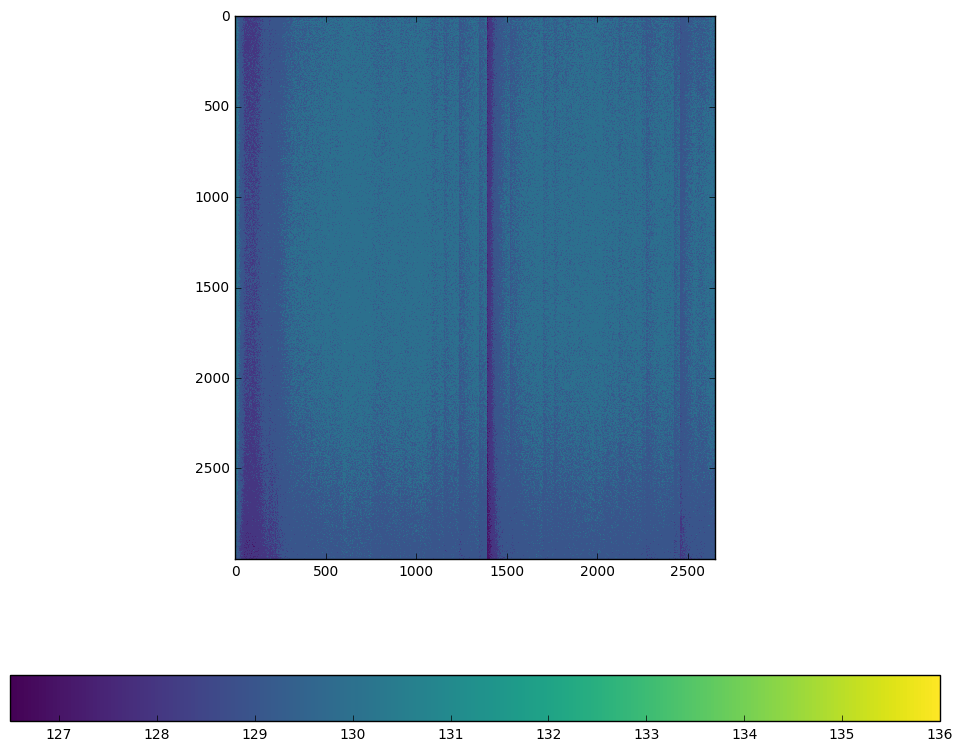

In [96]:
show_full(cv2.medianBlur(dark_image,3))

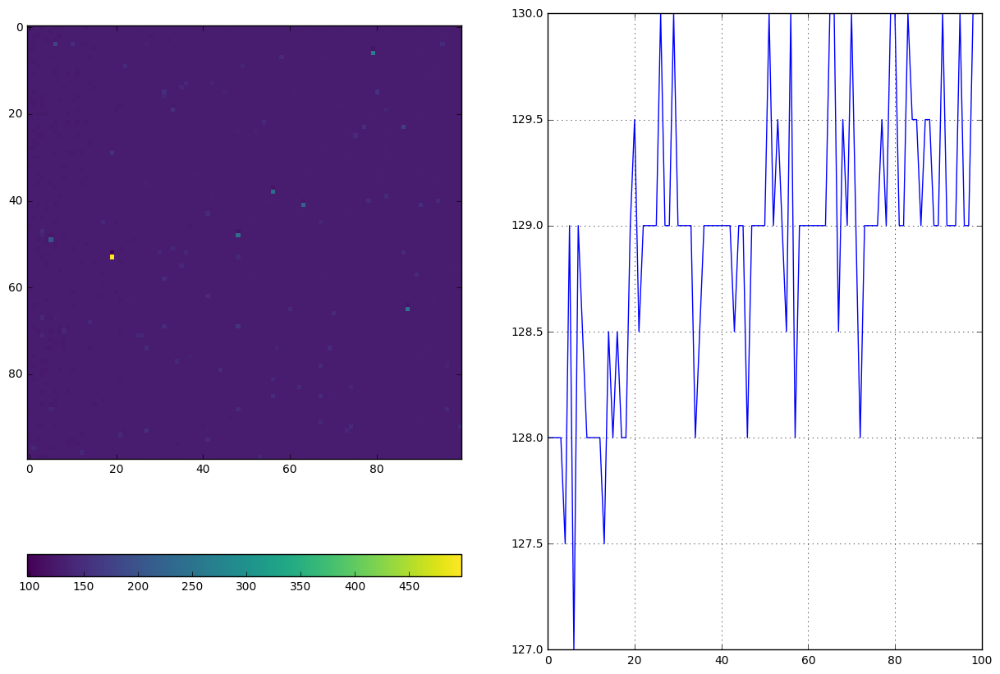

In [97]:
show_reg_cut(dark_image)

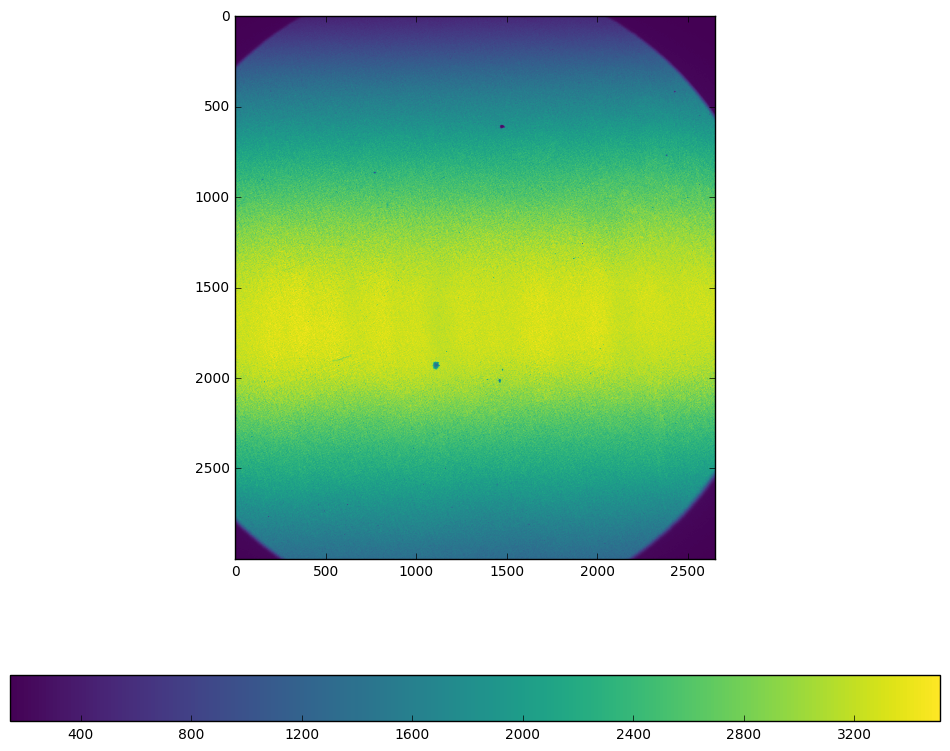

In [98]:
show_full(cv2.medianBlur(empty_images[0],3))

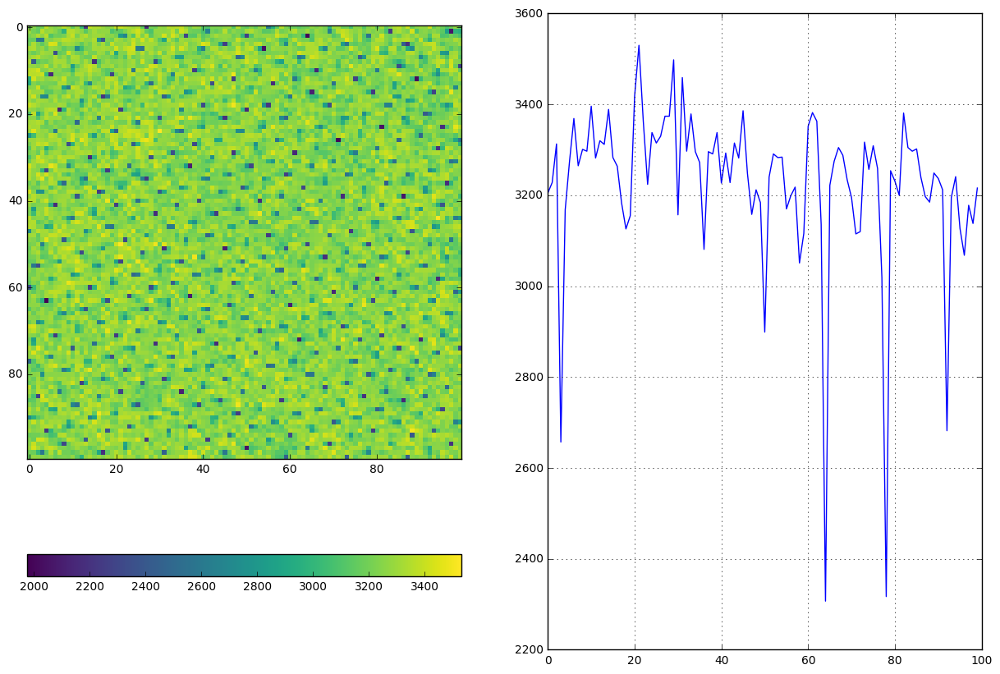

In [99]:
show_reg_cut(empty_images[0])

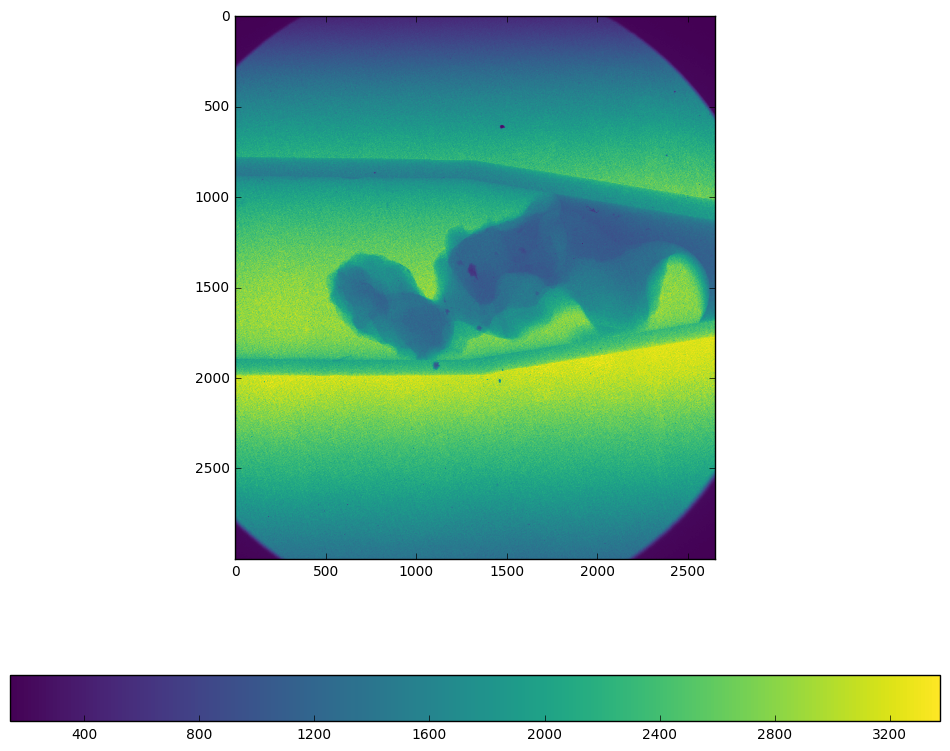

In [100]:
show_full(cv2.medianBlur(data_images[0],3))

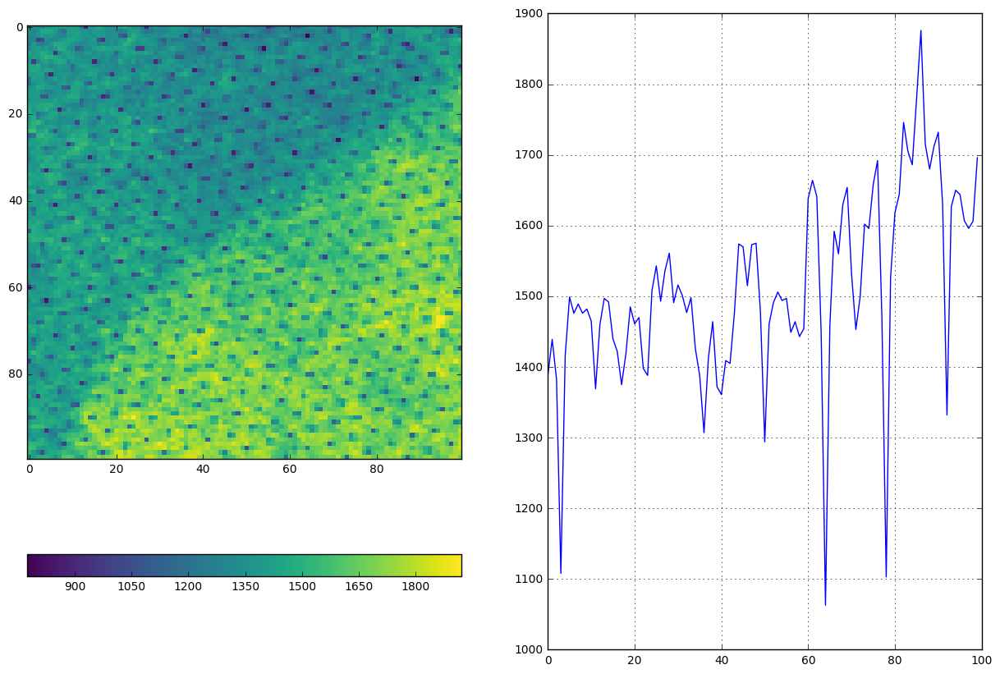

In [101]:
show_reg_cut(data_images[0])

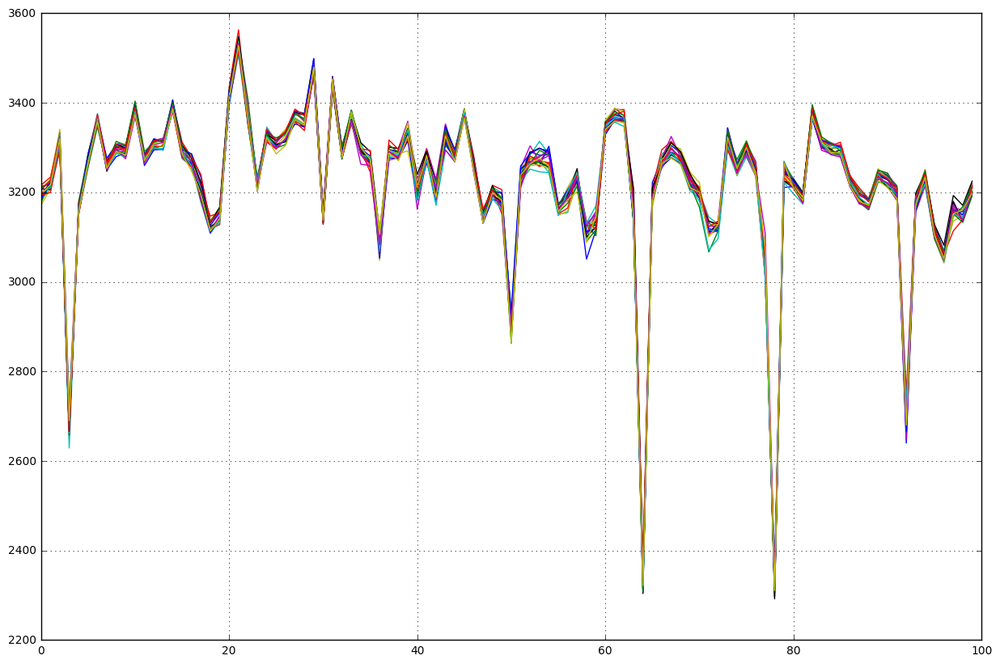

In [102]:
many_plots(empty_images)

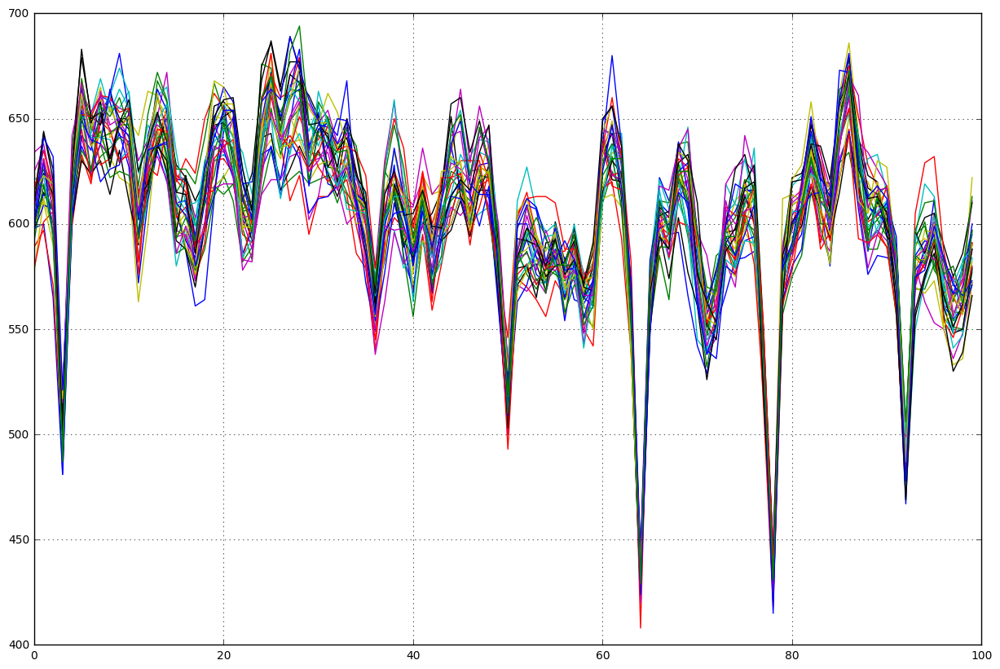

In [81]:
many_plots(np.vstack([empty_images, data_images[0:10]]))

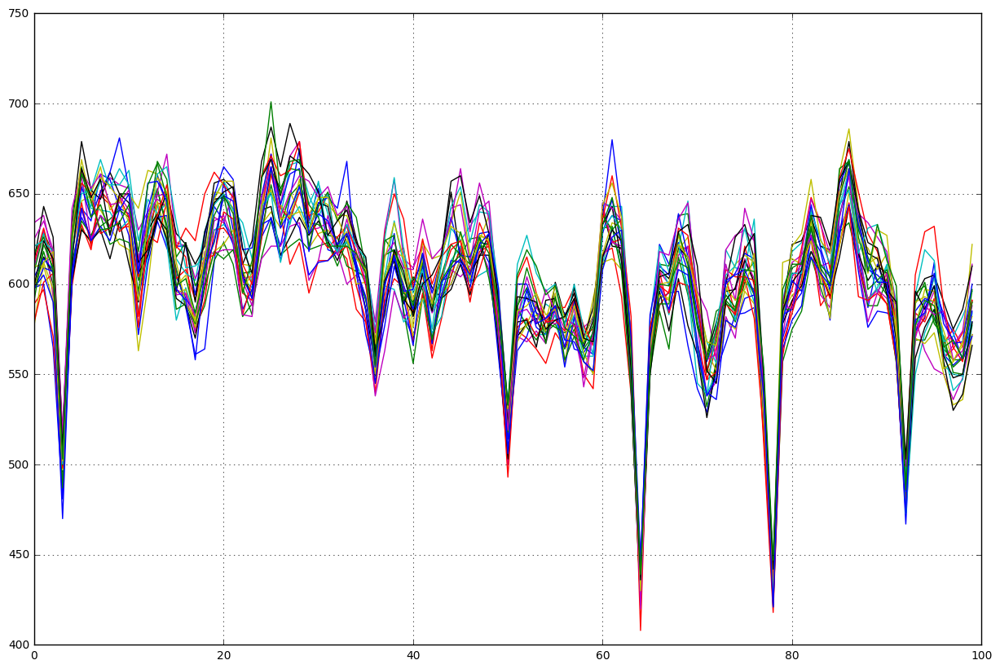

In [82]:
many_plots(np.vstack([empty_images, data_images[::100]]))

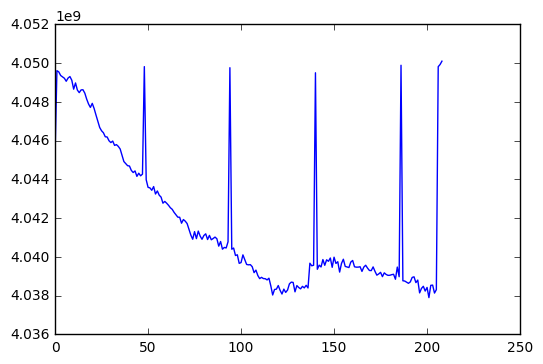

In [83]:
plt.figure()
plt.plot(data_images.sum(axis=-1).sum(axis=-1)[np.argsort(data_angles)])

/home/makov/opt/anaconda/envs/astra-dbg/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in divide
  if __name__ == '__main__':
/home/makov/opt/anaconda/envs/astra-dbg/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


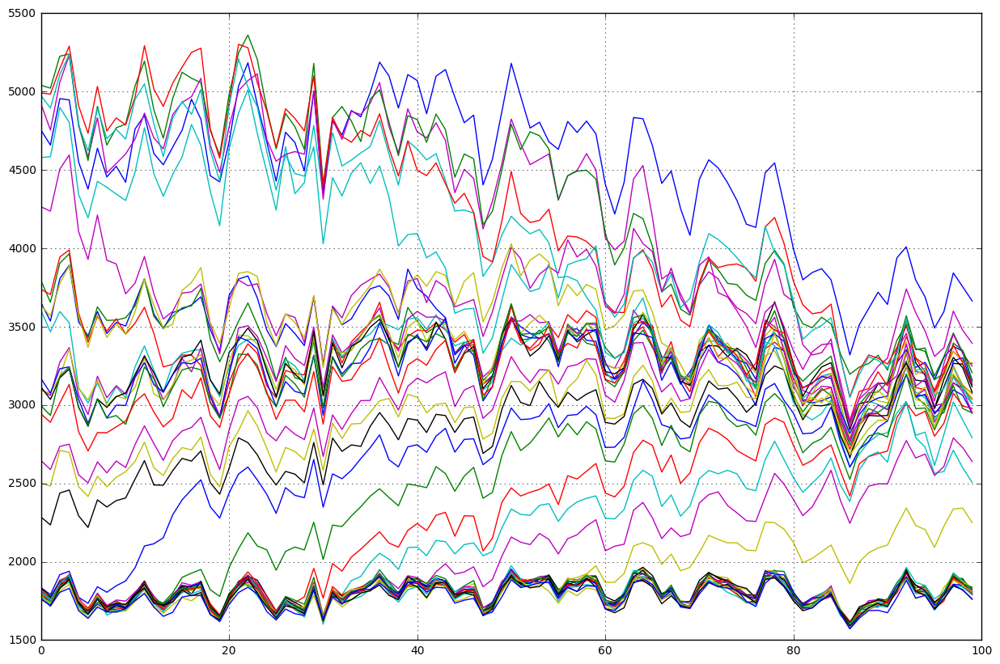

In [103]:
many_plots(1500*empty_beam/(data_images[0::10]-dark_image))

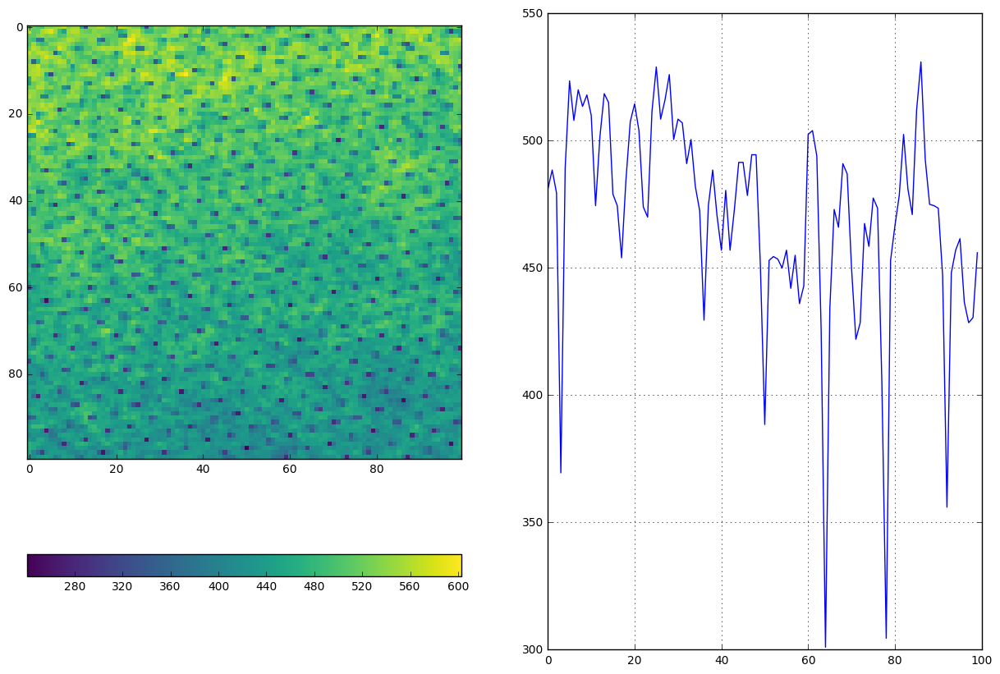

In [86]:
show_reg_cut(empty_beam)

/home/makov/opt/anaconda/envs/astra-dbg/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in divide
  if __name__ == '__main__':
/home/makov/opt/anaconda/envs/astra-dbg/lib/python2.7/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


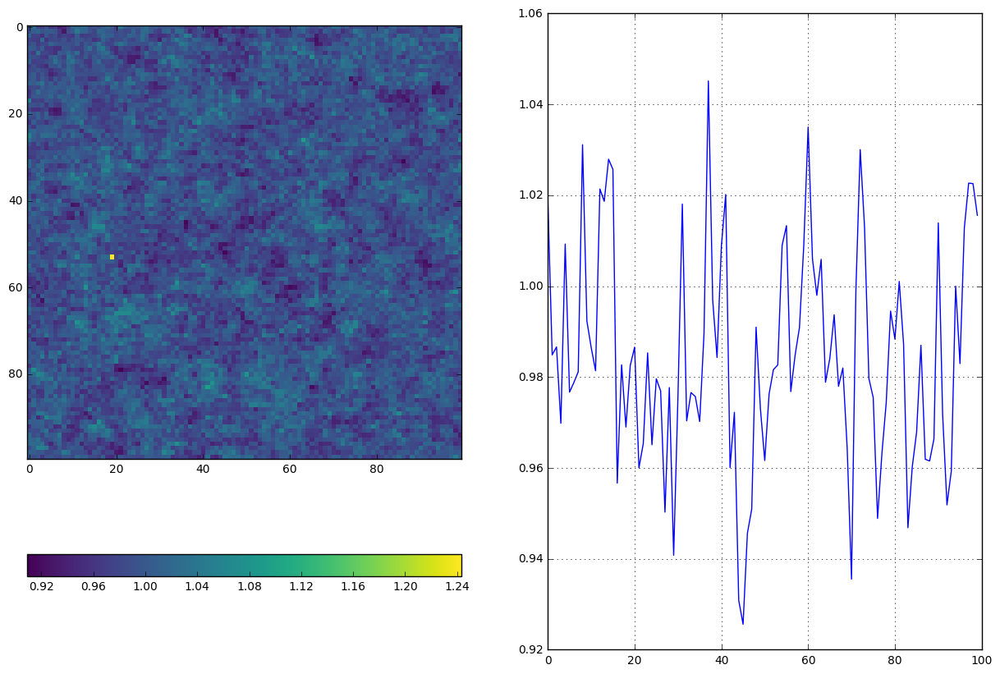

In [87]:
show_reg_cut(empty_beam/(data_images[0]-dark_image))

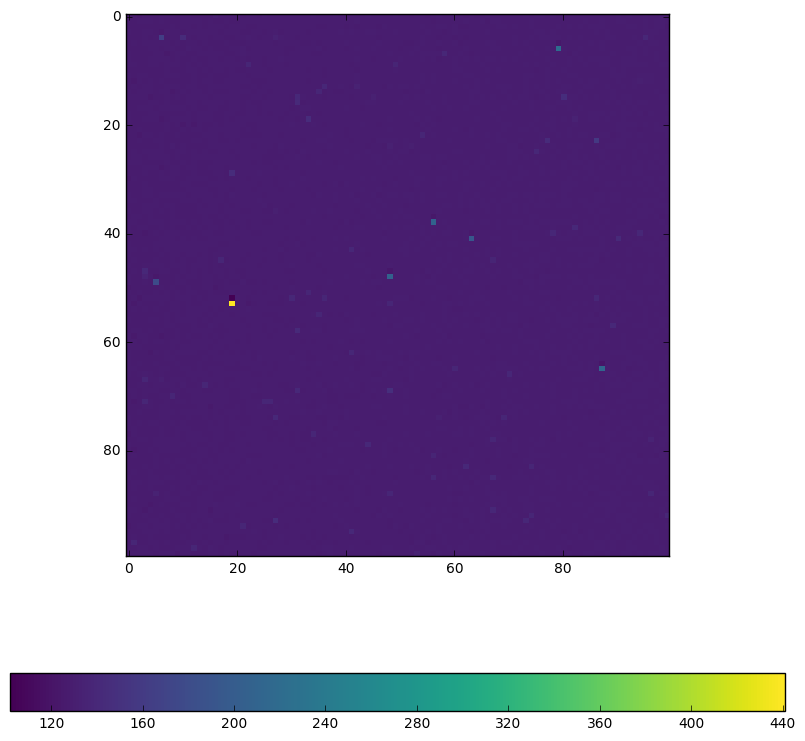

In [88]:
plt.figure(figsize=(10,10))
plt.imshow(dark_image[1600:1700,1400:1500], interpolation='nearest')
plt.colorbar(orientation='horizontal')

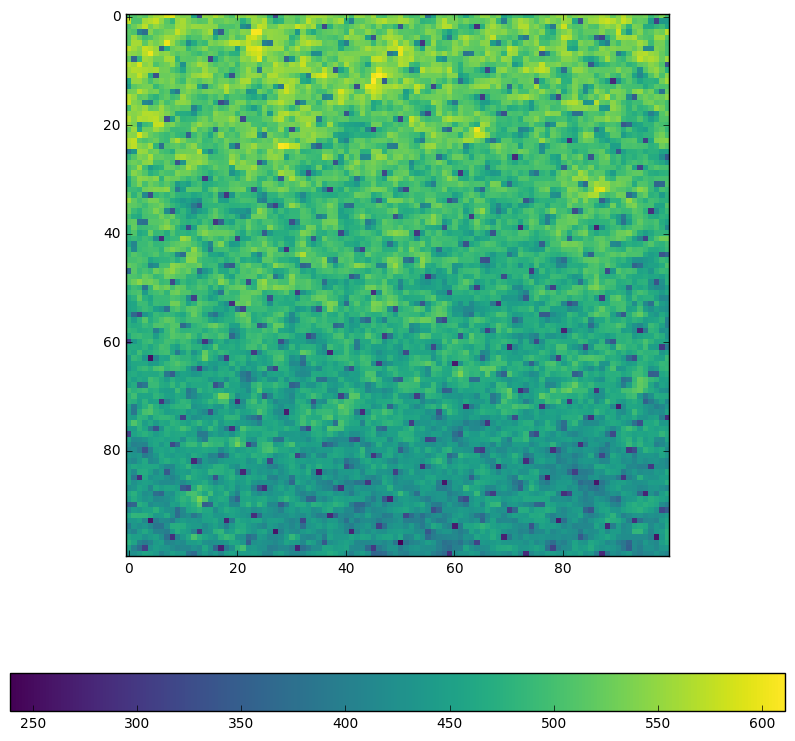

In [89]:
plt.figure(figsize=(10,10))
plt.imshow(data_images_clear[0][1600:1700,1400:1500],
          interpolation='nearest')
plt.colorbar(orientation='horizontal')

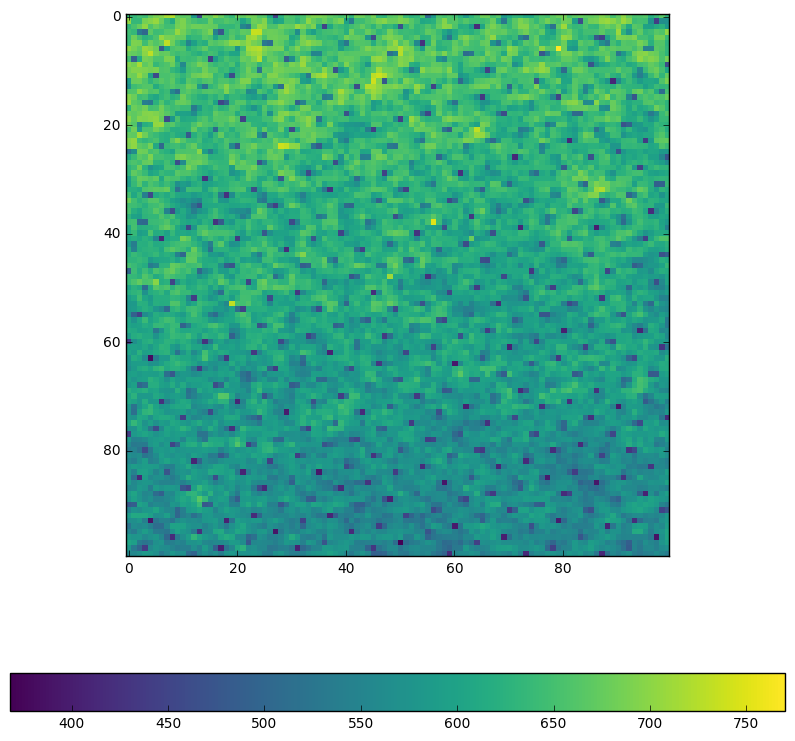

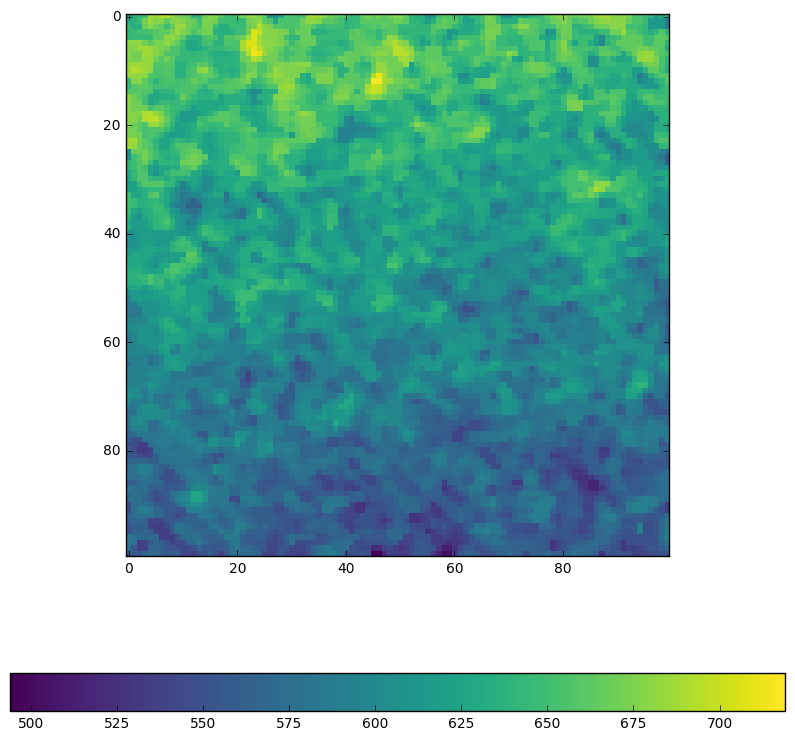

In [90]:
data=data_images[0]
data_orig = data[1600:1700,1400:1500].copy()
plt.figure(figsize=(10,10))
plt.imshow(data_orig,
          interpolation='nearest')
plt.colorbar(orientation='horizontal')

data_median = cv2.medianBlur(data_orig,3)
plt.figure(figsize=(10,10))
plt.imshow(data_median,
          interpolation='nearest')
plt.colorbar(orientation='horizontal')


In [48]:
from scipy.ndimage import morphology

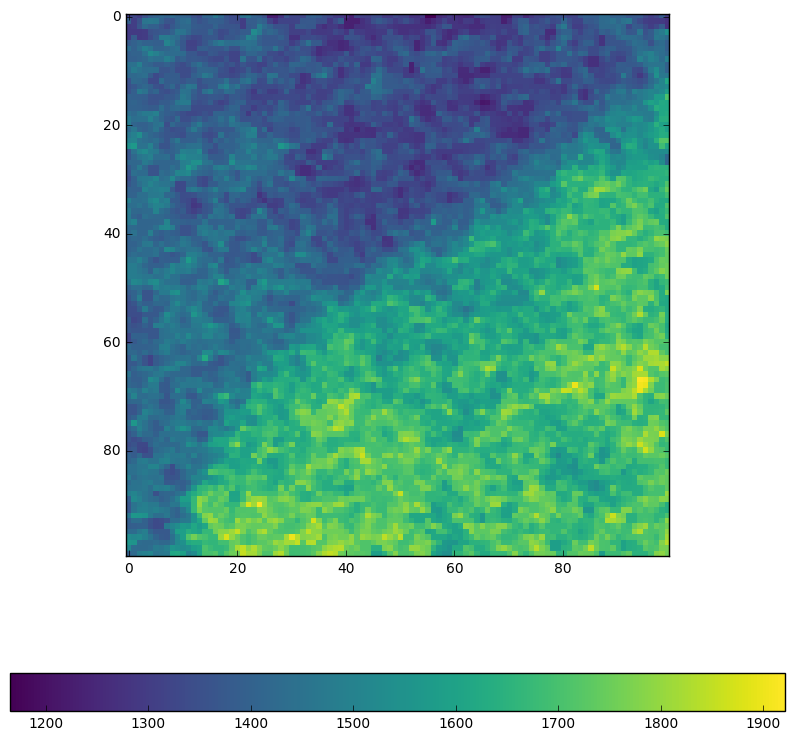

In [91]:
def remove_dots_inplace(image):
    image_median = cv2.medianBlur(image,3)
    mask = (image_median*image/(image*image+1))>1
    image[mask] = image_median[mask]
    
data_orig = data[1600:1700,1400:1500].copy()
remove_dots_inplace(data_orig)
plt.figure(figsize=(10,10))
plt.imshow(data_orig,
          interpolation='nearest')
plt.colorbar(orientation='horizontal')

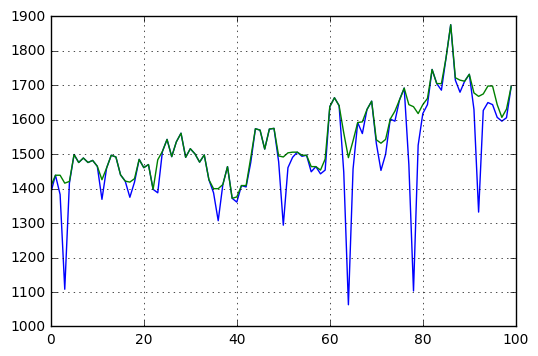

In [92]:
plt.figure()
plt.plot(data[1600:1700,1400:1500][50])
plt.plot(data_orig[50])
plt.grid()

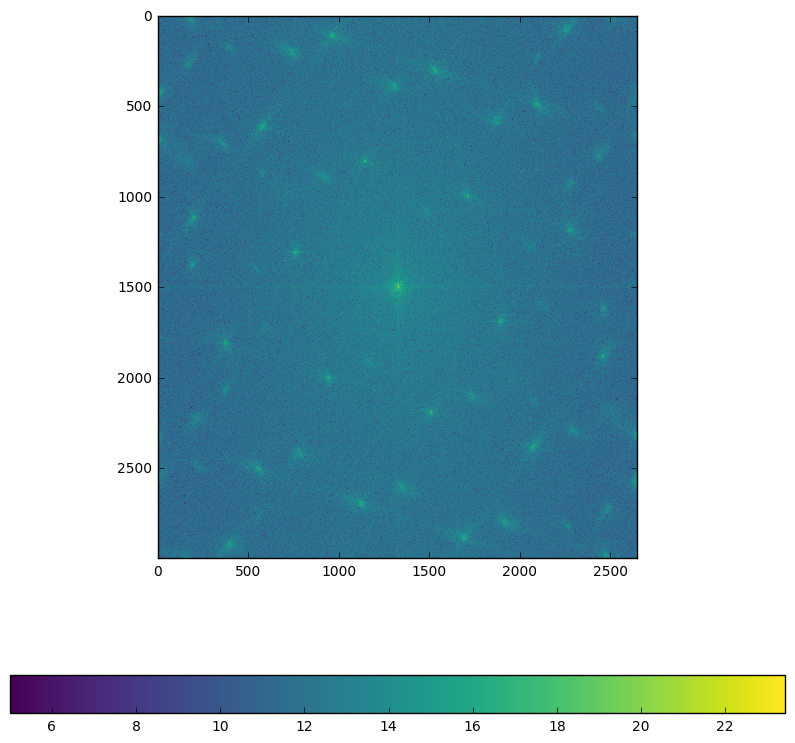

/home/makov/opt/anaconda/envs/astra-dbg/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: divide by zero encountered in log


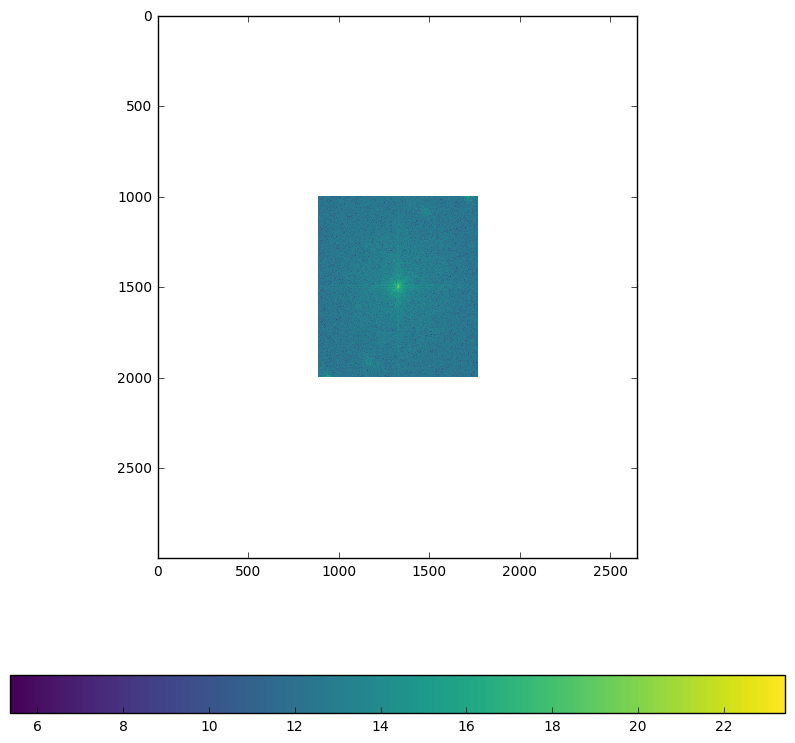

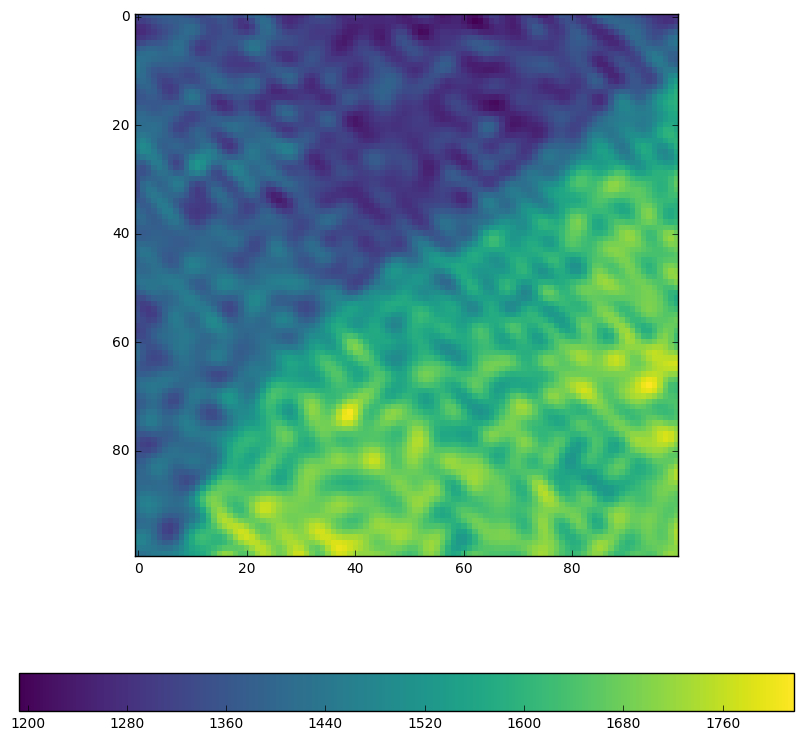

In [35]:
fft_data = np.fft.fft2(data)
fft_data=np.fft.fftshift(fft_data)
plt.figure(figsize=(10,10))
plt.imshow(np.log(np.abs(fft_data)),
          interpolation='nearest')
plt.colorbar(orientation='horizontal')
plt.show()

fs = fft_data.shape
fft_data[0:fs[0]//3]=0
fft_data[fs[0]*2//3:]=0
fft_data[:,0:fs[1]//3]=0
fft_data[:,fs[1]*2//3:]=0

plt.figure(figsize=(10,10))
plt.imshow(np.log(np.abs(fft_data)),
          interpolation='nearest')
plt.colorbar(orientation='horizontal')
plt.show()

data_new = np.abs(np.fft.ifft2(fft_data))

data=data_images[0]
plt.figure(figsize=(10,10))
plt.imshow(data_new[1600:1700,1400:1500],
          interpolation='nearest')
plt.colorbar(orientation='horizontal')
plt.show()

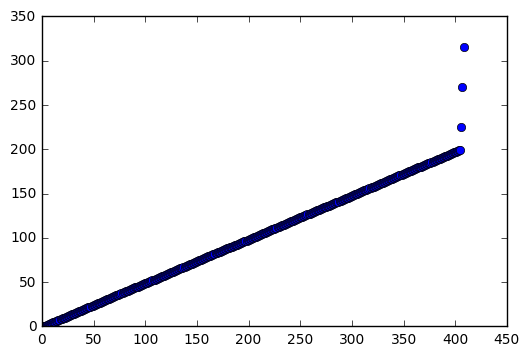

In [12]:
plt.plot(sorted(data_angles),'o')

In [99]:
empty_images, _ = tomotools.get_frame_group(data_file, 'empty', tmp_dir)

INFO:root:Creating new file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_empty.tmp
INFO:root:Creating new file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/group_empty_angles.tmp


(-0.5, 2999.5, 19.5, -0.5)

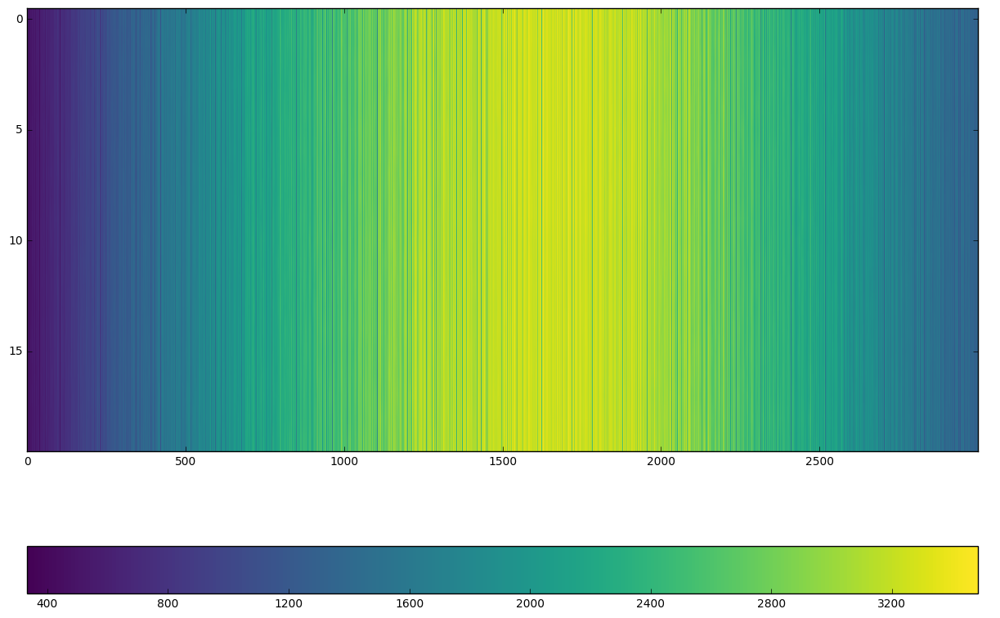

In [86]:
plt.figure(figsize=(15,10))
plt.imshow(empty_images[:,:,int(empty_images.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

In [12]:
from tomopy.prep.stripe import remove_stripe_fw

In [13]:
empty_clear = remove_stripe_fw(empty_images)

(-0.5, 2999.5, 19.5, -0.5)

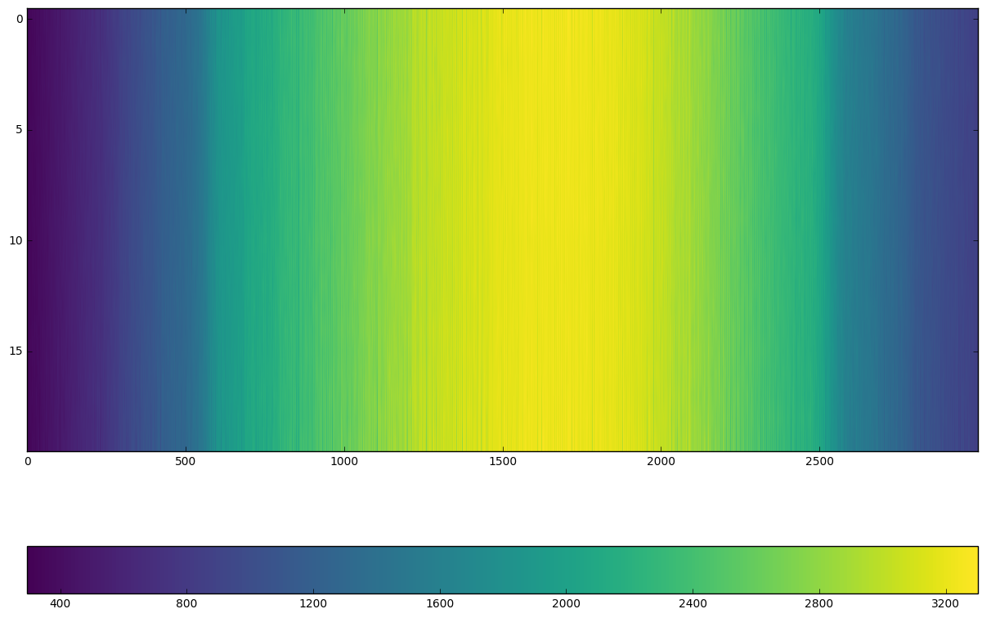

In [101]:
# for im in range(empty_images.shape[0]):
#     remove_dots_inplace(empty_images[im])

plt.figure(figsize=(15,10))
plt.imshow(empty_clear[:,:,int(empty_images.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

(-0.5, 2999.5, 408.5, -0.5)

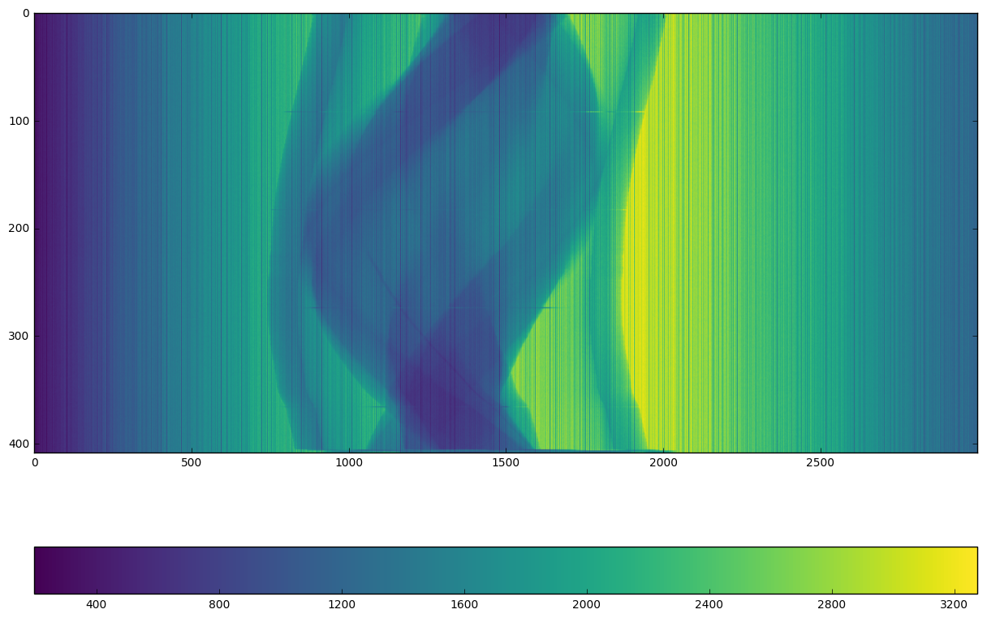

In [68]:
plt.figure(figsize=(15,10))
plt.imshow(data_images_clear[np.argsort(data_angles),:,int(data_images_clear.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

(-0.5, 2999.5, 408.5, -0.5)

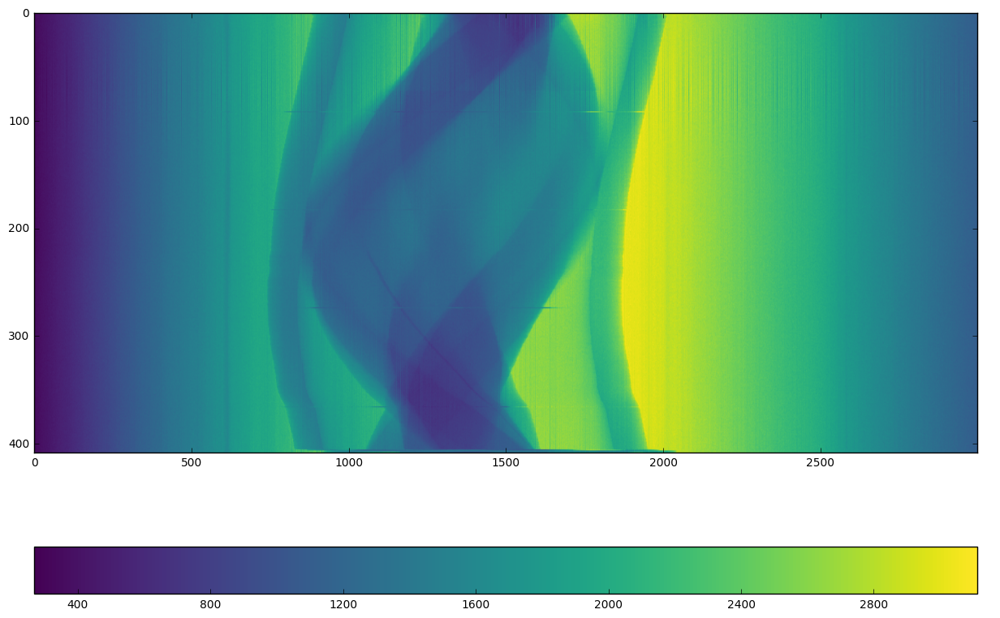

In [14]:
di_clear = remove_stripe_fw(data_images_clear)
    
plt.figure(figsize=(15,10))
plt.imshow(di_clear[np.argsort(data_angles),:,int(data_images_clear.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

In [64]:
data_images_clear.shape

(409, 3000, 2650)

(-0.5, 2999.5, 408.5, -0.5)

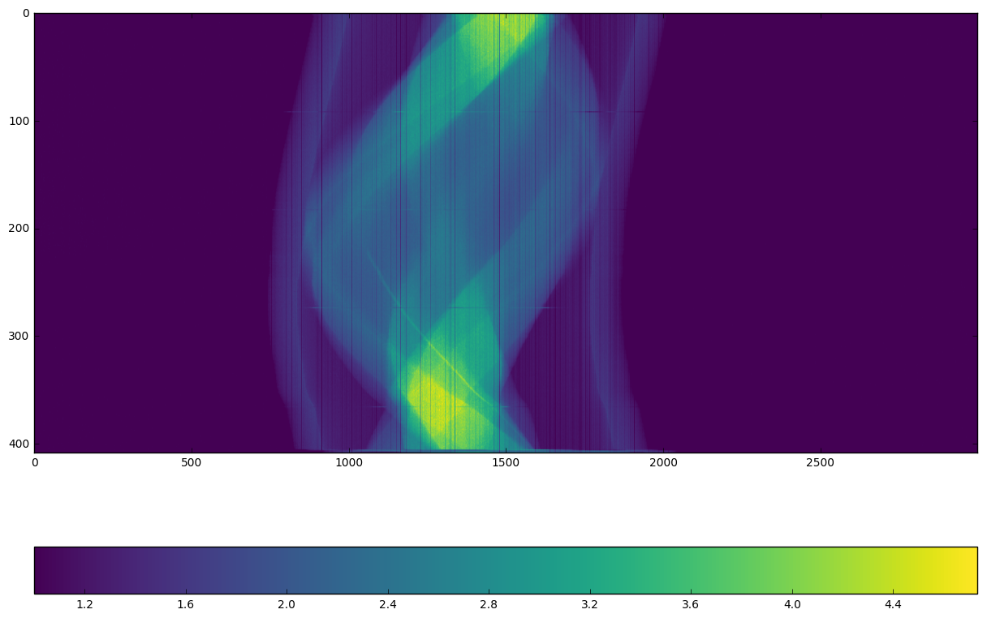

In [90]:
empty_cut = empty_beam[:,int(data_images_clear.shape[-1]/1.75)]
data_cut = data_images_clear[np.argsort(data_angles),:,int(data_images_clear.shape[-1]/1.75)]
plt.figure(figsize=(15,10))
plt.imshow(empty_cut/data_cut, vmin=1)
plt.colorbar(orientation='horizontal')
plt.axis('tight')

(-0.5, 2999.5, 408.5, -0.5)

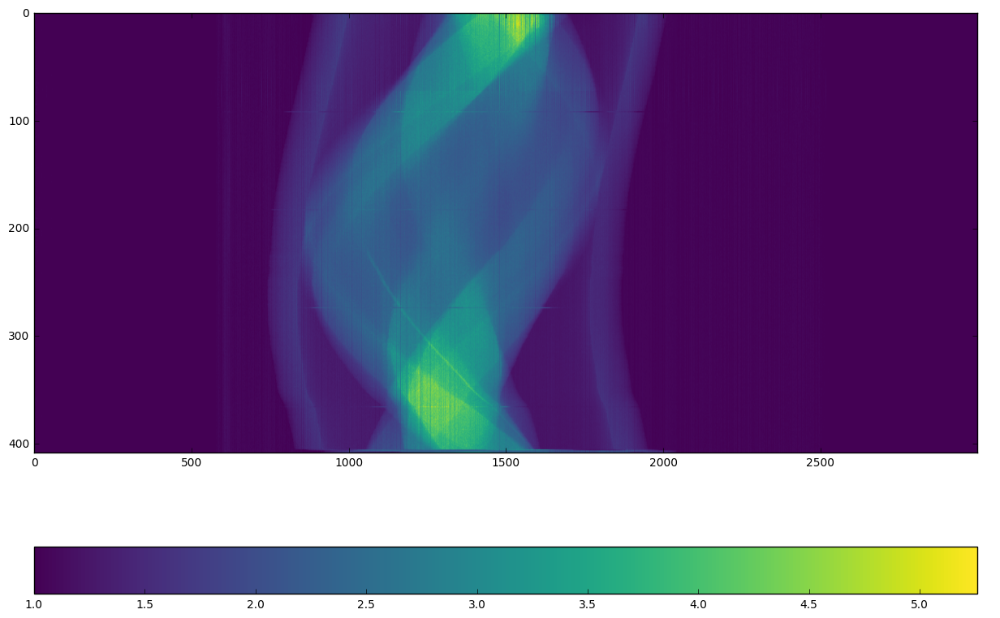

In [20]:
empty_cut = empty_clear[0,:,int(data_images_clear.shape[-1]/1.75)]
data_cut = di_clear[np.argsort(data_angles),:,int(data_images_clear.shape[-1]/1.75)]
plt.figure(figsize=(15,10))
plt.imshow(empty_cut/data_cut, vmin=1)
plt.colorbar(orientation='horizontal')
plt.axis('tight')

In [15]:
np.min(empty_cut/data_cut)

memmap(0.8929440379142761, dtype=float32)

(-0.5, 2999.5, 19.5, -0.5)

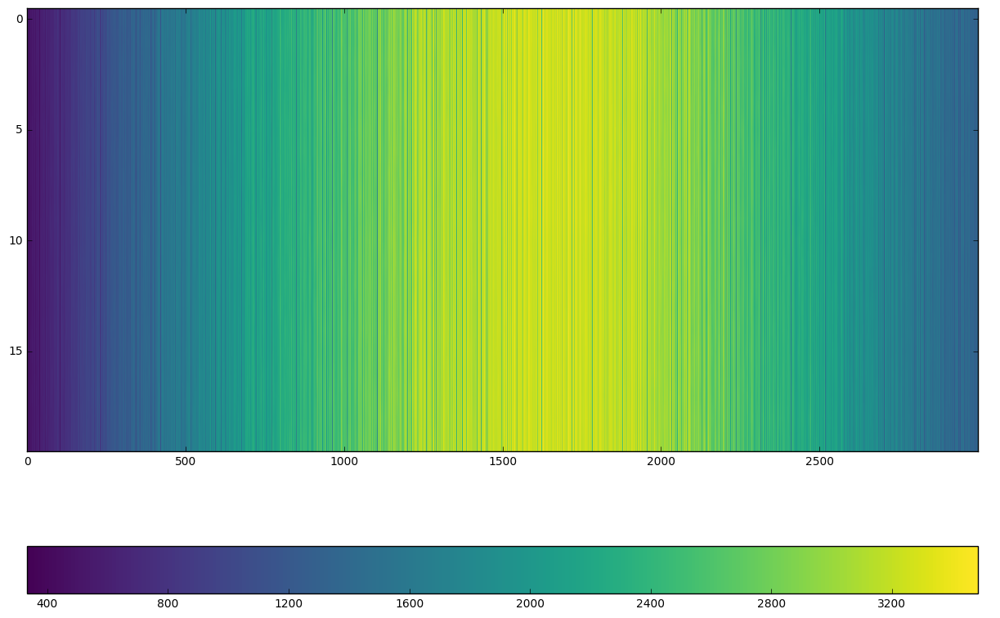

In [16]:
plt.figure(figsize=(15,10))
plt.imshow(empty_images[:,:,int(empty_images.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

(-0.5, 2999.5, 19.5, -0.5)

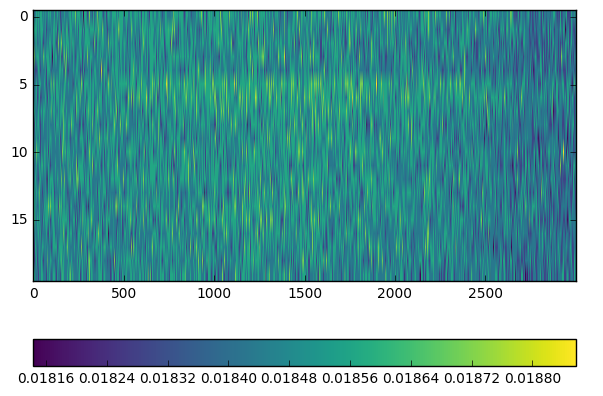

In [44]:
plt.figure(figsize=(7,5))
plt.imshow(dark_images[:,:,int(dark_images.shape[-1]/1.75)])
plt.colorbar(orientation='horizontal')
plt.axis('tight')

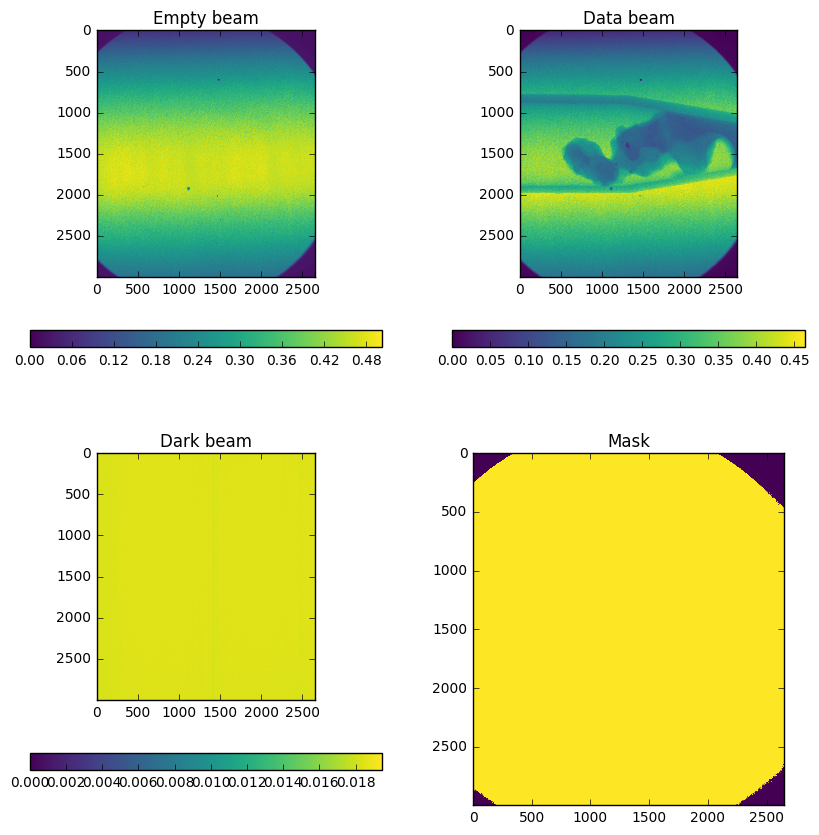

In [18]:
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(empty_image, vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Empty beam')

plt.subplot(222)
plt.imshow(data_images_clear[0], vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Data beam')


plt.subplot(223)
plt.imshow(dark_image, vmin=0)
plt.colorbar(orientation='horizontal')
plt.title('Dark beam')


plt.subplot(224)
plt.imshow(mask.astype('int'))
# plt.colorbar(orientation='horizontal')
plt.title('Mask')
#TODO: Check thresshold automaticaly
# plt.plot([sum(empty_beam > i) for i in np.arange(100)])

In [22]:
# del data_images
# del data_angles
del empty_image
del empty_images
del dark_images
del dark_image


NameError: name 'dark_images' is not defined

In [23]:
%whos

Variable            Type          Data/Info
-------------------------------------------
astra               module        <module 'astra' from '/ho<...>ages/astra/__init__.pyc'>
cv2                 module        <module 'cv2' from '/home<...>.7/site-packages/cv2.so'>
data_angles         memmap        [  35.49845123   36.     <...>4.49535751   34.99690247]
data_dir            str           /diskmnt/fast/makov/robotom/
data_file           str           /diskmnt/fast/makov/robot<...>4e95-9a0f-b8ebf8724527.h5
data_images_clear   memmap        [[[ 0.00327857  0.0031642<...>353571\n    0.00361428]]]
empty_beam          memmap        [[ 0.0033      0.00320715<...>00328571\n   0.00305714]]
experiment_id       str           32518375-b859-4e95-9a0f-b8ebf8724527
experiment_is       str           32518375-b859-4e95-9a0f-b8ebf8724527
h5f                 File          <Closed HDF5 file>
h5py                module        <module 'h5py' from '/hom<...>kages/h5py/__init__.pyc'>
json                modu

In [ ]:
# # try find automatic threshold for mask
# x_range = np.arange(0,0.2,0.01)
# plt.plot(x_range, [(empty_beam > x).sum().astype('float32')/np.prod(empty_beam.shape) for x in x_range])

In [35]:
def crop_mask(mask, up, bottom, left, right):
    threshold = 100
    mask_x_profile = mask.sum(axis=1)
    mask_x_min = np.argwhere(mask_x_profile>threshold).min()+up # up border
    mask_x_max = np.argwhere(mask_x_profile>threshold).max()-bottom # bottom border

    mask_y_profile = mask.sum(axis=0)
    mask_y_min = np.argwhere(mask_y_profile>threshold).min()+left # left border
    mask_y_max = np.argwhere(mask_y_profile>threshold).max()-right # right border
    return  mask_x_min, mask_x_max, mask_y_min, mask_y_max

In [36]:
mask_x_min, mask_x_max, mask_y_min, mask_y_max = crop_mask(mask, 400, 400, 100, 100)

mask_new = np.copy(mask[mask_x_min:mask_x_max,mask_y_min:mask_y_max])
# empty_beam = empty_beam[mask_x_min:mask_x_max,mask_y_min:mask_y_max]
## FIX IT
# data_images_croped = data_images_croped[:, mask_x_min:mask_x_max,mask_y_min:mask_y_max]

data_images_masked, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'data_images_masked.tmp'),
                                   shape = (data_angles.shape[0],
                                           mask_new.shape[0], mask_new.shape[1]), dtype='float32',
                                   force_create=True)

empty_masked, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'empty_images_masked.tmp'),
                                   shape = (mask_new.shape[0], mask_new.shape[1]), dtype='float32',
                                   force_create=True)

empty_masked[:] = empty_beam[mask_x_min:mask_x_max,mask_y_min:mask_y_max]


plt.figure()
plt.imshow(data_images_clear[0, mask_x_min:mask_x_max,mask_y_min:mask_y_max])
plt.colorbar(orientation='horizontal')

for di in range(data_images_masked.shape[0]):
    data_images_masked[di] = data_images_clear[di, mask_x_min:mask_x_max,mask_y_min:mask_y_max]

del empty_beam
del data_images_clear

NameError: name 'data_angles' is not defined

In [34]:
def group_data(data_images,data_angles,  mmap_file_dir):
    uniq_angles,_ = tomotools.load_create_mm(
        os.path.join(mmap_file_dir,'uniq_angles.tmp'),
        shape=(len(list(set(data_angles))),),
        dtype='float32',force_create=True)
    uniq_angles[:] = list(set(data_angles))
    
    uniq_data_images,_ = tomotools.load_create_mm(
        os.path.join(mmap_file_dir,'uniq_data_images.tmp'),
        shape=(len(uniq_angles), data_images.shape[1], data_images.shape[2]),
        dtype='float32',force_create=True)

    for ua_id, ua in enumerate(uniq_angles):
        indexes = np.argwhere(data_angles==uniq_angles[ua_id])
        if len(indexes)>1:
            tmp_images = data_images[indexes]
            tmp_images = np.squeeze(tmp_images)
            mean_image = np.mean(tmp_images, axis=0)
            uniq_data_images[ua_id] = mean_image
        else:
            uniq_data_images[ua_id]=data_images[indexes]
    return uniq_data_images, uniq_angles

uniq_data_images, uniq_angles = group_data(data_images_masked, data_angles, tmp_dir)
del data_images_masked, data_angles

NameError: name 'data_images_masked' is not defined

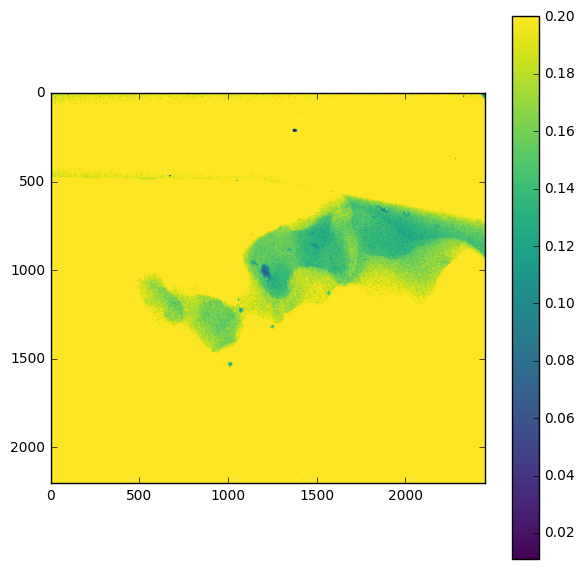

In [27]:
plt.figure(figsize=(7,7))
plt.imshow(uniq_data_images[1], vmax=0.2)
plt.colorbar()

In [28]:
#normalize data frames and calculate sinograms
empty_masked[empty_masked <= 0] = 1e-9

for di in range(uniq_data_images.shape[0]):
    t = uniq_data_images[di]
    t[t<0] = 1e-9
    t=t/empty_masked
    t[t>1] = 1
    t[t<1e-8] = 1e-8
    uniq_data_images[di] = t

del empty_masked

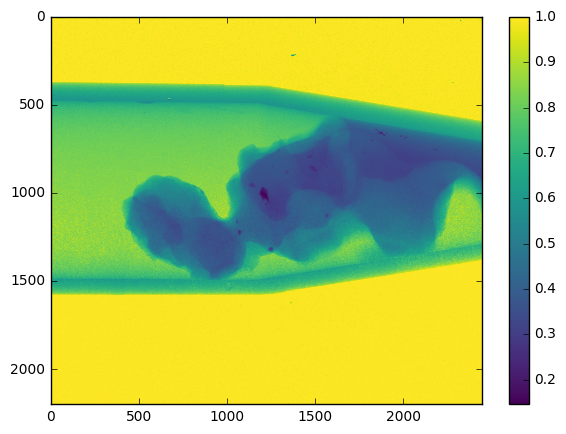

In [29]:
plt.figure(figsize=(7,5))
plt.imshow(uniq_data_images[1])
plt.colorbar()

In [33]:
plt.figure(figsize=(7,5))
plt.imshow(uniq_data_images[np.argsort(uniq_angles),:,int(sinogram.shape[-1]/1.75)])
plt.colorbar()

NameError: name 'uniq_data_images' is not defined

In [30]:
sinogram, _ = tomotools.load_create_mm(os.path.join(tmp_dir, 'sinogram.tmp'), shape=uniq_data_images.shape,
                         dtype='float32') 
ne.evaluate('-log(uniq_data_images)', out=sinogram);

INFO:root:Creating new file: /diskmnt/fast/makov/robotom/32518375-b859-4e95-9a0f-b8ebf8724527/sinogram.tmp


In [31]:
del uniq_data_images

In [ ]:
# # build frames for video
# images_dir = os.path.join(tmp_dir,'images')
# tomotools.mkdir_p(images_dir)
# im_max=np.max(sinogram)
# im_min=np.min(sinogram)
# print(im_min, im_max)
# for ia, a in tomotools.log_progress(list(enumerate(np.argsort(uniq_angles)))):
# #     print('{:34}'.format(ia))
#     plt.imsave(os.path.join(images_dir,'prj_{:03}.png'.format(ia)),
#                np.rot90(sinogram[a],3), vmin=im_min, vmax=im_max,
#                cmap=plt.cm.gray_r)

In [ ]:
# !cd {images_dir} && avconv -r 10 -i "prj_%03d.png" -b:v 1000k prj.avi

In [ ]:
# !cd {images_dir} && rm prj.mp4

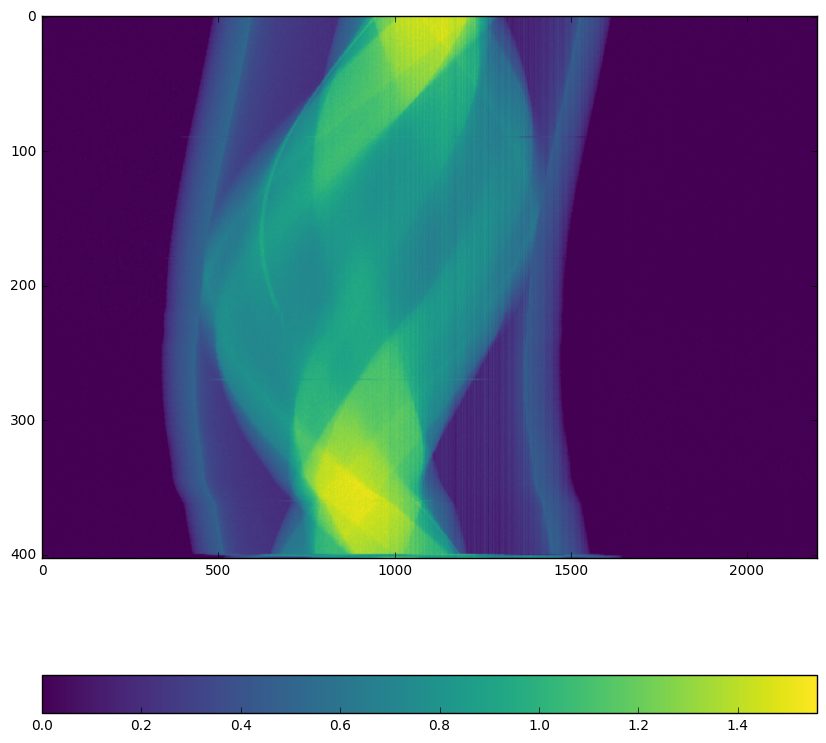

In [32]:
tmp_sinogram = sinogram[np.argsort(uniq_angles),:,int(sinogram.shape[-1]/1.75) ]

plt.figure(figsize=(10,10))
plt.imshow(tmp_sinogram, cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [ ]:
# seraching detector rotation angle
zero_angle = np.min(uniq_angles)
position_0 = np.argwhere(np.isclose(uniq_angles, zero_angle, atol=0.05))[0][0]
print uniq_angles[position_0], position_0

position_180 = np.argwhere(np.isclose(uniq_angles, 180+zero_angle, atol=0.05))[0][0]
print uniq_angles[position_180], position_180

def cv_rotate(x, angle):
    """
    Rotate square array using OpenCV2 around center of the array
    :param x: 2d numpy array
    :param angle: angle in degrees
    :return: rotated array
    """
    x_center = tuple(
        np.array((x.shape[1], x.shape[0]), dtype='float32') / 2.0 - 0.5)
    rot_mat = cv2.getRotationMatrix2D(x_center, angle, 1.0)
    xro = cv2.warpAffine(
        x, rot_mat, (x.shape[1], x.shape[0]), flags=cv2.INTER_LINEAR)
    return xro


data_0 = np.rot90(sinogram[position_0]).copy()
data_180 = np.rot90(sinogram[position_180]).copy()

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(sorted(uniq_angles))
plt.grid(True)
plt.show()

In [ ]:
from scipy.optimize import minimize
def f(x):
    alfa= x[0]
    shift = int(x[1])
    if shift >= 0:
        t = enp.fliplr(cv_rotate(data_180[:,shift:],alfa))-cv_rotate(data_0[:,shift:],alfa)
    else:
        t = np.fliplr(cv_rotate(data_180[:,:shift],alfa))-cv_rotate(data_0[:,shift],alfa)
        
    res = np.sum(t*t)/np.prod(t.shape)
    return res

def corr(x):
    alfa= x[0]*10.
    shift = int(x[1])
    if shift >= 0:
        t_180 = data_180[:,shift:]
        t_0 = data_0[:,shift:]
    else:
        t_180 = data_180[:,:shift]
        t_0 = data_0[:,:shift]
    
    
#     t_mask = np.zeros_like(t_0)
#     shape_min = np.min(t_mask.shape)
#     r_mask = shape_min//2
#     X,Y = np.meshgrid(np.arange(t_mask.shape[1])-t_mask.shape[1]//2,
#                       np.arange(t_mask.shape[0])-t_mask.shape[0]//2)
#     t_mask = X**2+Y**2<r_mask**2    
    
    tt_180 = np.fliplr(cv_rotate(t_180,alfa))
    tt_180 = cv2.medianBlur(tt_180,5) #*t_mask
    tt_0 = cv_rotate(t_0,alfa)
    tt_0 = cv2.medianBlur(tt_0,5) #*t_mask
    res = -np.correlate(tt_0.flat,tt_180.flat)
#     TODO: add mask support 
#     res = -np.sum(tt_0*tt_180)/np.sqrt(np.sum(tt_0**2)*np.sum(tt_180**2))*np.prod(tt_0.shape) #*np.prod(t_mask.shape)
    return res

x0 = [0.1,-355]
res= minimize(corr, x0, method='Nelder-Mead')
print res

In [ ]:
alfa, shift = res.x[0]*10., int(res.x[1])

if shift >= 0:
    t_180 = data_180[:,shift:]
    t_0 = data_0[:,shift:]
else:
    t_180 = data_180[:,:shift]
    t_0 = data_0[:,:shift]
    
tt_180 = np.fliplr(cv_rotate(t_180,alfa))
tt_0 = cv_rotate(t_0,alfa)
    
plt.figure(figsize=(15,15))
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis)
plt.title('a={}, s={}'.format(alfa,shift))
plt.colorbar()
plt.show()


In [ ]:
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(data_0,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(222)
plt.imshow(data_180,cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(223)
plt.imshow(data_0 - np.fliplr(data_180),cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')
plt.subplot(224)
# alfa = 0.1
# shift = -77
plt.imshow(tt_180-tt_0, cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar(orientation='horizontal')

In [ ]:
sinogram_fixed, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'sinogram_fixed.tmp'),
                                shape=(sinogram.shape[0], sinogram.shape[1]-abs(shift),sinogram.shape[2]),
                                dtype='float32')

#fix axis tlit
for i in range(sinogram.shape[0]):
    if shift >= 0:
        t = cv_rotate(sinogram[i,shift:],alfa)
    else:
        t = cv_rotate(sinogram[i,:shift],alfa)
    sinogram_fixed[i] = t
del sinogram

In [ ]:
s1 = np.require(sinogram_fixed[...,int(sinogram_fixed.shape[-1]/1.5)],
                dtype=np.float32, requirements=['C'])

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(s1[np.argsort(uniq_angles)], cmap=plt.cm.viridis)
plt.axis('tight')
plt.colorbar()
plt.show()

In [ ]:
del sinogram_fixed

In [ ]:
del data_0, data_180 ,tmp_sinogram, uniq_angles

In [ ]:
del empty_image, mask, t_0, t_180, zero_angle

In [ ]:
uniq_angles, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'uniq_angles.tmp'),
                             shape= None,
                             dtype='float32')
s1, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'sinogram_fixed.tmp'),
                                shape= None,
                                dtype='float32')

rec_vol, _ = tomotools.load_create_mm(os.path.join(tmp_dir,'rec.tmp'),
               dtype=np.float32,
               shape = (s1.shape[-1],s1.shape[1],s1.shape[1]))



In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(s1[np.argsort(uniq_angles),:,int(s1.shape[-1]/1.75)], cmap=plt.cm.viridis)
plt.colorbar(orientation='horizontal')
plt.axis('tight')
plt.show()

In [ ]:
def astra_tomo2d_parallel(sinogram, angles):
    astra.astra.set_gpu_index([1,])
    angles = angles.astype('float64')
    detector_size = sinogram.shape[1]
    

    rec_size = detector_size
    vol_geom = astra.create_vol_geom(rec_size, rec_size)
    proj_geom = astra.create_proj_geom('parallel', 1.0, detector_size, angles)


    sinogram_id = astra.data2d.create('-sino', proj_geom, data=sinogram)
    # Create a data object for the reconstruction
    rec_id = astra.data2d.create('-vol', vol_geom)
#     proj_id = astra.create_projector('strip', proj_geom, vol_geom) # for CPU reconstruction only
    # Set up the parameters for a reconstruction algorithm using the GPU
    cfg = astra.astra_dict('CGLS_CUDA')
    cfg['ReconstructionDataId'] = rec_id
    cfg['ProjectionDataId'] = sinogram_id
#     cfg['ProjectorId'] = proj_id # for CPU reconstruction only
    cfg['option'] = {}
    cfg['option']['MinConstraint'] = -0.01
    # cfg['option']['MaxConstraint'] = 5

    # Available algorithms:
    # SIRT_CUDA, SART_CUDA, EM_CUDA, FBP_CUDA (see the FBP sample)

    # Create the algorithm object from the configuration structure
    
    alg_id = astra.algorithm.create(cfg)
    
    # Run 150 iterations of the algorithm
    astra.algorithm.run(alg_id, 30)
    # Get the result
    rec = astra.data2d.get(rec_id)
    
    # Clean up. Note that GPU memory is tied up in the algorithm object,
    # and main RAM in the data objects.
    astra.algorithm.delete(alg_id)
    astra.data2d.delete(rec_id)
    astra.data2d.delete(sinogram_id)
    astra.clear()
    return rec

#BROKEN
def astra_tomo3d_parallel(sinogram, angles, rec_vol, slice_start, slice_stop):
    astra.astra.set_gpu_index([1,])
    angles = angles.astype('float64')
    detector_size = sinogram.shape[1]
#         slices_number = sinogram.shape[0]
    slices_number = slice_stop - slice_start
        
    rec_size = detector_size
    vol_geom = astra.create_vol_geom(rec_size, rec_size, slices_number)
    proj_geom = astra.create_proj_geom('parallel3d', 1.0, 1.0,  slices_number, detector_size, angles)


    sinogram_id = astra.data3d.create('-sino', proj_geom, np.rollaxis(sinogram,-1)[slice_start:slice_stop])
    # Create a data object for the reconstruction
#     rec_id = astra.data3d.link('-vol', vol_geom, rec_vol[slice_start:slice_stop])
    rec_id = astra.data3d.create('-vol', vol_geom)
    # Set up the parameters for a reconstruction algorithm using the GPU
    cfg = astra.astra_dict('CGLS3D_CUDA')
    cfg['ReconstructionDataId'] = rec_id
    cfg['ProjectionDataId'] = sinogram_id
#     cfg['ProjectorId'] = proj_id # for CPU reconstruction only
    cfg['option'] = {}
    #cfg['option']['MinConstraint'] = 0
    cfg['option']['MinConstraint'] = -0.01

    # Available algorithms:
    # SIRT_CUDA, SART_CUDA, EM_CUDA, FBP_CUDA (see the FBP sample)

    # Create the algorithm object from the configuration structure
    alg_id = astra.algorithm.create(cfg)
#     astra.data3d.info()
    # Run 150 iterations of the algorithm
    astra.algorithm.run(alg_id, 30)
    
    # Get the result
    rec = astra.data3d.get(rec_id)

    # Clean up. Note that GPU memory is tied up in the algorithm object,
    # and main RAM in the data objects.
    astra.algorithm.delete(alg_id)
    astra.data3d.delete(rec_id)
    astra.data3d.delete(sinogram_id)
    astra.clear()
    return rec

In [ ]:
#preview 
rec_slice = astra_tomo2d_parallel(s1[...,int(s1.shape[-1]/1.75)], uniq_angles*np.pi/180)

plt.figure(figsize=(10,10))
plt.imshow(rec_slice, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [ ]:
t = time.time()
print s1.shape
step = 50
angles =np.array(uniq_angles)*np.pi/180
# for i in log_progress(range(1500, 1700, step)):
for i in tomotools.log_progress(range(0, s1.shape[-1], step)):
    slice_start= i 
    slice_stop= min(i+step, s1.shape[-1])
    rec_vol[slice_start:slice_stop] = astra_tomo3d_parallel(s1, angles, rec_vol,
                                       slice_start=slice_start, slice_stop=slice_stop
                                  )
print(time.time()-t)

In [ ]:
rec_vol.shape

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(rec_vol[int(rec_vol.shape[0]/2)], cmap=plt.cm.viridis, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [ ]:
rec_vol_filtered, _ = load_create_mm(os.path.join(tmp_dir,'rec_filtered.tmp'),
               dtype=np.float32,
               shape = rec_vol.shape)

In [ ]:
t = time.time()
print rec_vol.shape
step = 200
angles =np.array(uniq_angles)*np.pi/180
# for i in log_progress(range(1500, 1700, step)):
for i in log_progress(range(0, rec_vol.shape[0], step)):
    slice_start= i 
    slice_stop= min(i+step, s1.shape[-1])
    rec_vol_filtered[slice_start:slice_stop] = remove_ring(
        rec_vol[slice_start:slice_stop],
        thresh=0.0005,  theta_min=90, rwidth=10)
print(time.time()-t)

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(rec_vol_filtered[int(rec_vol_filtered.shape[0]/2/1.5)], cmap=plt.cm.viridis, vmin=0)
plt.axis('tight')
plt.colorbar()
plt.show()

In [ ]:
def save_amira(in_array, out_path, reshape=3):
    data_path = out_path
    with open(os.path.join(data_path, 'amira.raw'), 'wb') as amira_file:
        in_array[::reshape,::reshape,::reshape].tofile(amira_file)
        file_shape = in_array[::reshape,::reshape,::reshape].shape
        with open(os.path.join(data_path, 'tomo.hx'), 'w') as af:
                af.write('# Amira Script\n')
                af.write('remove -all\n')
                af.write(r'[ load -raw ${SCRIPTDIR}/amira.raw little xfastest float 1 '+
                         str(file_shape[1])+' '+str(file_shape[2])+' '+str(file_shape[0])+
                         ' 0 '+str(file_shape[1]-1)+' 0 '+str(file_shape[2]-1)+' 0 '+str(file_shape[0]-1)+
                         ' ] setLabel tomo.raw\n')


In [ ]:
save_amira(rec_vol_filtered, tmp_dir)

In [ ]:
# angles = np.array(uniq_angles)*np.pi/180
# for slice_numb in log_progress(range(s1.shape[-1])):
#     rec_vol[slice_numb] = astra_tomo2d_parallel(s1[...,slice_numb], angles)

In [ ]:
# %timeit rec_slice = astra_tomo2d_parallel(s1[...,1600], uniq_angles*np.pi/180)

In [ ]:
# rec_slice = astra_tomo2d_parallel(s1[...,1550], uniq_angles*np.pi/180)
# plt.figure(figsize=(10,10))
# plt.imshow(rec_slice, cmap=plt.cm.viridis, vmin=0)
# plt.axis('tight')
# plt.colorbar()
# plt.show()

In [ ]:
ss=np.array(7)

In [ ]:
ss.ndim